In [1]:
from config_and_logging import load_config

config = load_config()

print(config.get("models", {}))


[{'type': 'LinearRegression', 'params': {}}, {'type': 'RandomForest', 'params': {'n_estimators': 10, 'random_state': 42}}]


In [1]:
def set_datetime_as_index(df, freq='3h', fill_method='interpolate'):
    """
    Convert 'time' column to datetime index, reindex to regular intervals,
    and impute missing rows.

    Parameters:
    - df: pd.DataFrame with a 'time' column
    - freq: str, frequency string for datetime (default='3H')
    - fill_method: str, one of ['interpolate', 'ffill', 'bfill', 'zero']

    Returns:
    - DataFrame with datetime index at regular intervals and missing values filled
    """
    import pandas as pd

    # Convert and sort time
    df['time'] = pd.to_datetime(df['time'])
    df = df.set_index('time')

    # Create complete datetime index
    full_index = pd.date_range(start=df.index.min(), end=df.index.max(), freq=freq)

    # Reindex
    df = df.reindex(full_index)

    # Identify fully missing rows
    fully_missing_mask = df.isna().all(axis=1)

    # Apply imputation only to fully missing rows
    if fill_method == 'interpolate':
        df.loc[fully_missing_mask] = df.interpolate().loc[fully_missing_mask]
    elif fill_method == 'ffill':
        df.loc[fully_missing_mask] = df.ffill().loc[fully_missing_mask]
    elif fill_method == 'bfill':
        df.loc[fully_missing_mask] = df.bfill().loc[fully_missing_mask]
    elif fill_method == 'zero':
        df.loc[fully_missing_mask] = 0
    else:
        raise ValueError("Unsupported fill_method. Choose from ['interpolate', 'ffill', 'bfill', 'zero'].")

    df = df.asfreq('3h')

    return df

def preprocess_data(df):

    # Convert Valencia_wind_deg to numerical values
    df['Valencia_wind_deg_cat'] = df['Valencia_wind_deg'].astype(str).str.replace('level_', '').astype(int)
    df = df.drop(columns=['Valencia_wind_deg'])

    # Convert Seville_pressure to numerical values
    df['Seville_pressure_cat'] = df['Seville_pressure'].astype(str).str.replace('sp', '').astype(int)
    df = df.drop(columns=['Seville_pressure'])

    # Ensure time is datetime type
    df = set_datetime_as_index(df)
    # Remove any unwanted columns
    if 'Unnamed: 0' in df.columns:
        df = df.drop(columns=['Unnamed: 0'])

    return df

## Observations
* Target var is skewed positively
* Strong seasonal patterns, monthly, day in week, hour in day
*Seens trend effect as well, when does it show trend?
* ONly Valencia_pressure has missing (2000 missing). missing more in jan/dec an d in the middle of the day. first use simpe imputer (median), Time-based KNN seems most effective
* Not all cities have the same weather variables. Implications model (?)
* no clear relationships for scatter plots. Perhaps should check aggregates of variables, and temporal relation/correlation
* clear outlier in Barc. pressure variable. Perhaps robust scaler is enough
* some rows missing for 3h frequency, those are imputed

Add features for seasonality, monthly, day in week, hour in day, perhaps also day in year / Public holidays get online
Model that can handle skewed data
Next steps

Further look at correlations between wind variables. Include all variables here. Perhaps look at grouping on cities/weather var in correlation between variables
Understand trend/ seasonality graph, how to include
Create temporal features
Investigate outliers, interaction effects
Check to change categorical to numerical vars
Investigate lagged effects

missing door index gefixt. 
* AR1 model werkt, maar niet goed. getest met ACF, PACF. lage AR (1/2) is nuttig met seasonal effect erin

In [191]:
from data_loading import load_data
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np 
import pandas as pd

train_df, test_df, sample_submission = load_data()
copy_train_df = train_df.copy()
copy_test_df = test_df.copy()


test_df = preprocess_data(test_df)
train_df = preprocess_data(train_df)

## Check presence of varaibles per city

In [193]:
def get_variables_by_type(df, variable_type):
    """
    Collects all variables of a specific type for all cities.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    variable_type : str
        The type of variable to collect (e.g., 'weather_id', 'temp', 'wind_speed', etc.)
        
    Returns:
    --------
    list
        A list of all column names containing the specified variable type
    """
    # List of all cities
    cities = ['Madrid', 'Valencia', 'Seville', 'Bilbao', 'Barcelona']
    
    # Collect all columns containing the variable type
    variables = []
    for city in cities:
        column_name = f"{city}_{variable_type}"
        if column_name in df.columns:
            variables.append(column_name)
            
    return variables



# Function to check categorical and numerical variables
def check_variables(df):
    # Check categorical variables
    categorical_vars = df.select_dtypes(include=['object', 'category']).columns.tolist()
    print("Categorical Variables:")
    for var in categorical_vars:
        unique_options = df[var].unique()
        print(f"{var}: {unique_options}")

    # Check numerical variables
    numerical_vars = df.select_dtypes(include=['number']).columns.tolist()
   
    # Organize numerical variables by type
    variable_types = {
        'wind_speed': [],
        'wind_deg_cat': [],
        'wind_deg': [],  
        'rain_1h': [],
        'rain_3h': [],
        'humidity': [],
        'clouds_all': [],
        'pressure_cat': [],
        'pressure': [],
        'snow_3h': [],
        'weather_id': [],
        'temp_max': [],
        'temp_min': [],
        'temp': []
    }

    for var in numerical_vars:
        for key in variable_types.keys():
            
            if key in var:
                variable_types[key].append(var)
                break
  
    print("\nNumerical Variables:")
    for var_type, vars in variable_types.items():
        print(f"\n{var_type.capitalize()} Variables:")
        for var in vars:
            min_val = df[var].min()
            max_val = df[var].max()
            range_val = max_val - min_val
            print(f"{var}: Min = {min_val}, Max = {max_val}, Range = {range_val}")

# Check variables for the training set
print("Training Set:")
check_variables(train_df)

# Check variables for the test set
print("\nTest Set:")
check_variables(test_df)

Training Set:
Categorical Variables:

Numerical Variables:

Wind_speed Variables:
Madrid_wind_speed: Min = 0.0, Max = 13.0, Range = 13.0
Valencia_wind_speed: Min = 0.0, Max = 52.0, Range = 52.0
Bilbao_wind_speed: Min = 0.0, Max = 12.6666666667, Range = 12.6666666667
Barcelona_wind_speed: Min = 0.0, Max = 12.6666666667, Range = 12.6666666667
Seville_wind_speed: Min = 0.0, Max = 11.6666666667, Range = 11.6666666667

Wind_deg_cat Variables:
Valencia_wind_deg_cat: Min = 1.0, Max = 10.0, Range = 9.0

Wind_deg Variables:
Bilbao_wind_deg: Min = 0.0, Max = 359.3333333333, Range = 359.3333333333
Barcelona_wind_deg: Min = 0.0, Max = 360.0, Range = 360.0

Rain_1h Variables:
Bilbao_rain_1h: Min = 0.0, Max = 3.0, Range = 3.0
Barcelona_rain_1h: Min = 0.0, Max = 12.0, Range = 12.0
Seville_rain_1h: Min = 0.0, Max = 3.0, Range = 3.0
Madrid_rain_1h: Min = 0.0, Max = 3.0, Range = 3.0

Rain_3h Variables:
Seville_rain_3h: Min = 0.0, Max = 0.0933333333, Range = 0.0933333333
Barcelona_rain_3h: Min = 0.0, Max

## Visualizations

In [206]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Set the visual style
sns.set_theme(style="whitegrid")

def analyze_target_variable(train_df):
    """Analyze the distribution and time series of the target variable."""
    
    # Distribution plot
    plt.figure(figsize=(12, 6))
    sns.histplot(train_df['load_shortfall_3h'], kde=True, bins=50)
    plt.title('Distribution of Load Shortfall')
    plt.show()
    
    # Time series plot
    plt.figure(figsize=(14, 6))
    
    train_df['load_shortfall_3h'].plot(title='Load Shortfall Over Time')
    plt.ylabel('Shortfall Value')
    plt.show()

def analyze_temporal_patterns(train_df):
    """Analyze temporal patterns including seasonality decomposition."""

    
    # Time series decomposition
    ts_data = train_df['load_shortfall_3h'].resample('3h').mean()  # Changed 'H' to 'h'
    # Only decompose if we have enough data points
    if len(ts_data) >= 24*7:  # At least one week of data
        decomposition = seasonal_decompose(ts_data.dropna(), model='additive', period=24*7)
        decomposition.plot()
        plt.show()
    
    # Time-based aggregations
    train_df['hour'] = train_df.index.hour
    train_df['day_of_week'] = train_df.index.dayofweek
    train_df['month'] = train_df.index.month
    
    plt.figure(figsize=(14, 8))
    plt.subplot(3, 1, 1)
    train_df.groupby('hour')['load_shortfall_3h'].mean().plot(title='Hourly Average Shortfall')
    plt.subplot(3, 1, 2)
    train_df.groupby('day_of_week')['load_shortfall_3h'].mean().plot(title='Daily (Weekday) Average Shortfall')
    plt.subplot(3, 1, 3)
    train_df.groupby('month')['load_shortfall_3h'].mean().plot(title='Monthly Average Shortfall')
    plt.tight_layout()
    plt.show()

def analyze_weather_relationships(train_df):
    """Analyze relationships between weather variables and target."""
    weather_types = ['weather_id', 'wind_deg','wind_speed', 'rain_1h', 'rain_3h', 'humidity', 'clouds_all', 'pressure' 'temp', 'snow_3h']

    weather_vars=[]
    for var in train_df.columns.to_list():
        for weather in weather_types:
            if weather in var:
                weather_vars.append(var)
                break
    
    # Correlation matrix
    corr_matrix = train_df[weather_vars + ['load_shortfall_3h']].corr()
     # Plot correlation matrix
    plt.figure(figsize=(15, 15))
    sns.heatmap(corr_matrix, 
                cmap='coolwarm',
                center=0,
                vmin=-1,
                vmax=1,
                xticklabels=True,
                yticklabels=True)
    
    plt.title('Weather Variables and Load Shortfall Correlation Matrix')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

def plot_variables_vs_load_shortfall(df, target_column='load_shortfall_3h'):
    """
    Creates scatter plots for all variable types against the load shortfall.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    target_column : str
        The target column to plot against (default: 'load_shortfall_3h')
    """
    # List of all variable types
    variable_types = [
        'wind_speed',
        'wind_deg',
        'rain_1h',
        'rain_3h',
        'humidity',
        'clouds_all',
        'pressure',
        'snow_3h',
        'weather_id',
        'temp_max',
        'temp_min',
        'temp'
    ]
    
    # Create scatter plots for each variable type
    for var_type in variable_types:
        # Get all variables of this type
        vars_of_type = get_variables_by_type(df, var_type)
        
        # Create scatter plot for each variable
        for var in vars_of_type:
            plt.figure(figsize=(8, 4))
            sns.scatterplot(data=df, x=var, y=target_column, alpha=0.3)
            plt.title(f'{var} vs. Load Shortfall')
            plt.xlabel(var)
            plt.ylabel('Load Shortfall')
            plt.show()

def analyze_city_patterns(train_df, cities=['Madrid', 'Valencia', 'Seville', 'Bilbao', 'Barcelona']):
    """Analyze patterns across different cities."""
    city_shortfalls = train_df[[f'{city}_wind_speed' for city in cities] + ['load_shortfall_3h']].melt(
        id_vars='load_shortfall_3h', var_name='city', value_name='wind_speed'
    )
    city_shortfalls['city'] = city_shortfalls['city'].str.split('_').str[0]
    
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=city_shortfalls, x='city', y='load_shortfall_3h')
    plt.title('Load Shortfall Distribution by City')
    plt.show()

def analyze_data_quality(train_df):
    """Analyze missing data"""
    # Missing data analysis
    missing = train_df.isnull().sum() / len(train_df)
    missing = missing[missing > 0].sort_values(ascending=False)
    plt.figure(figsize=(10, 6))
    missing.plot(kind='bar', title='Percentage of Missing Values by Feature')
    plt.ylabel('Proportion Missing')
    plt.show()
    

def analyze_interactions(train_df):
    """#Analyze interaction effects between variables.
"""    
    # Temperature × Hour interaction
    temp_hour = train_df.groupby(['hour', 'temp'])['load_shortfall_3h'].mean().unstack()
    plt.figure(figsize=(12, 8))
    sns.heatmap(temp_hour, cmap='viridis', cbar_kws={'label': 'Average Shortfall'})
    plt.title('Temperature × Hour Interaction')
    plt.show()
    
    # Non-linear wind speed effect
    train_df['wind_speed_cubed'] = train_df['wind_speed'] ** 3
    sns.scatterplot(data=train_df, x='wind_speed_cubed', y='load_shortfall_3h', alpha=0.3)
    plt.title('Wind Speed³ vs. Load Shortfall')
    plt.show()
    

In [200]:
def analyze_temporal_patterns_one_year(train_df, year=2016):
    """Analyze temporal patterns including seasonality decomposition for a specific year."""

    # Filter data for the specified year
    year_data = train_df[train_df.index.year == year]

    # Time series decomposition
    ts_data = year_data['load_shortfall_3h'].resample('3h').mean()

    # Only decompose if we have enough data points
    if len(ts_data) >= 24*7:  # At least one week of data
        decomposition = seasonal_decompose(ts_data.dropna(), model='additive', period=24*7)

        # Plot decomposition components separately
        fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)

        # Observed data
        decomposition.observed.plot(ax=axes[0], label='Observed', legend=True)
        axes[0].set_ylabel('Observed')

        # Trend
        decomposition.trend.plot(ax=axes[1], label='Trend', legend=True)
        axes[1].set_ylabel('Trend')

        # Seasonal
        decomposition.seasonal.plot(ax=axes[2], label='Seasonal', legend=True)
        axes[2].set_ylabel('Seasonal')

        # Residual
        decomposition.resid.plot(ax=axes[3], label='Residual', legend=True)
        axes[3].set_ylabel('Residual')

        plt.xlabel('Date')
        plt.suptitle(f'Decomposition for Year {year}')
        plt.tight_layout()
        plt.show()

    # Time-based aggregations for the specific year
    year_data['hour'] = year_data.index.hour
    year_data['day_of_week'] = year_data.index.dayofweek
    year_data['month'] = year_data.index.month

    plt.figure(figsize=(14, 8))
    plt.subplot(3, 1, 1)
    year_data.groupby('hour')['load_shortfall_3h'].mean().plot(title=f'Hourly Average Shortfall for {year}')
    plt.subplot(3, 1, 2)
    year_data.groupby('day_of_week')['load_shortfall_3h'].mean().plot(title=f'Daily (Weekday) Average Shortfall for {year}')
    plt.subplot(3, 1, 3)
    year_data.groupby('month')['load_shortfall_3h'].mean().plot(title=f'Monthly Average Shortfall for {year}')
    plt.tight_layout()
    plt.show()


### Target variables

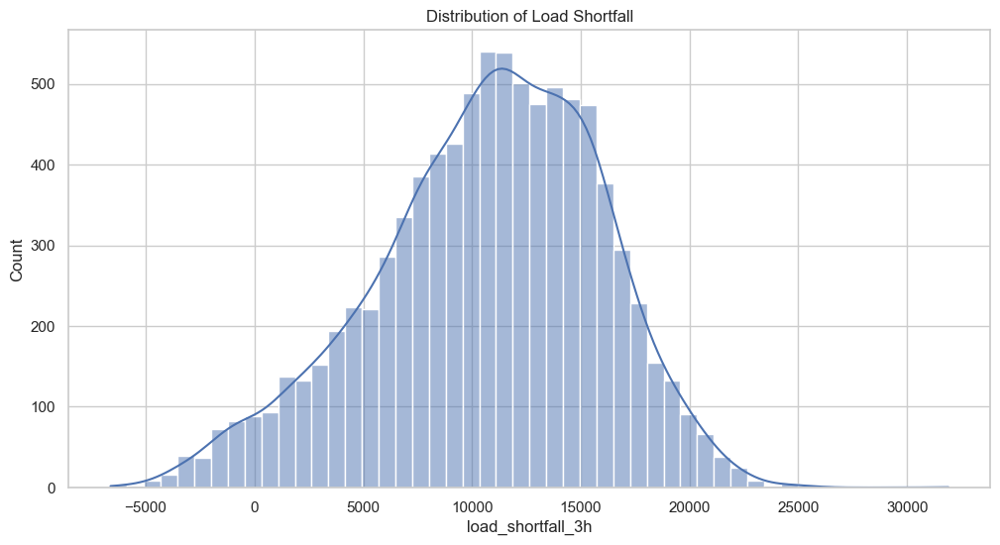

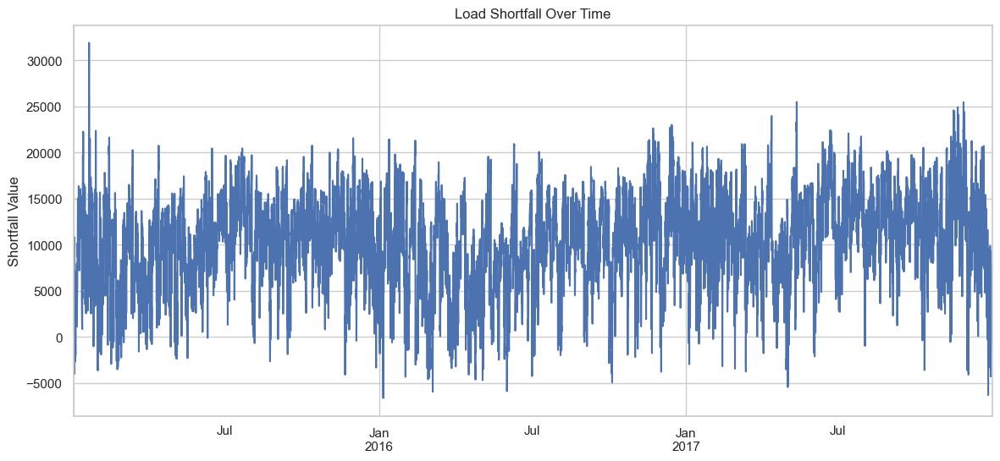

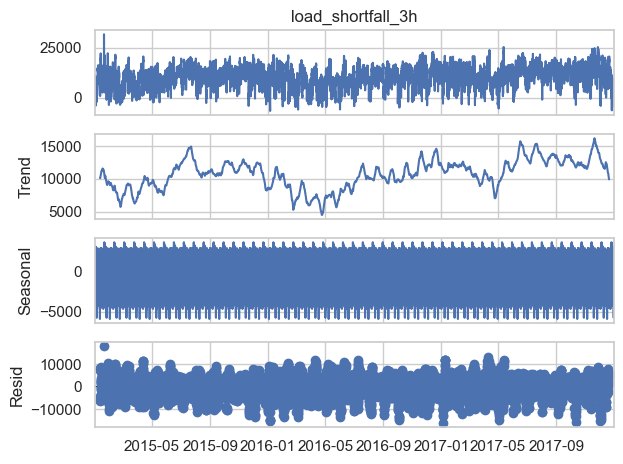

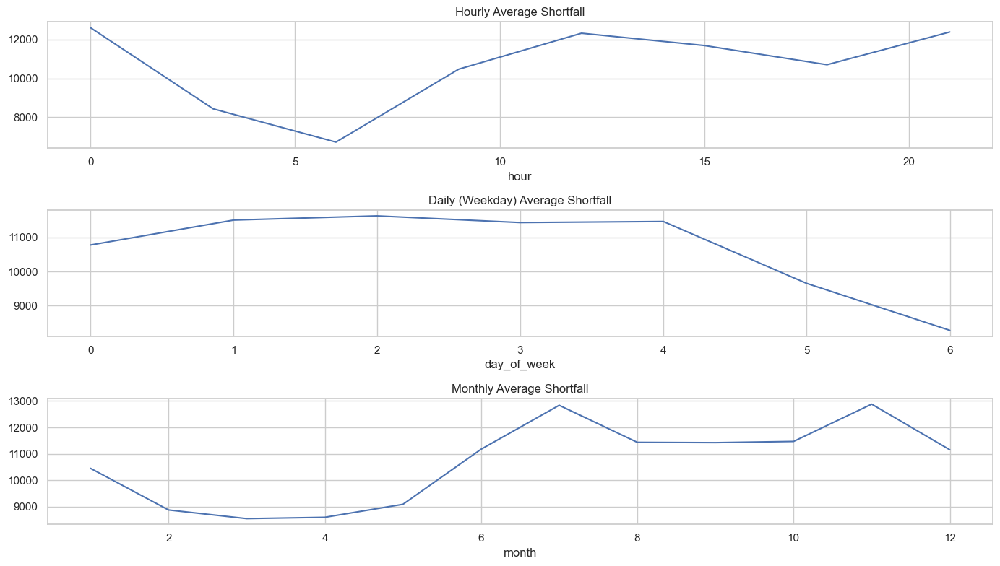

In [207]:
analyze_target_variable(train_df)
analyze_temporal_patterns(train_df)
#analyze_temporal_patterns_one_year(train_df)

### Explanatory variables

Temperature (incl. min max) is very correclated across spain.
We also see correlation between same variable types such as wind speec, clouds, humidity
Also rain is correlated with clouds in same city
Negative correlation between temprature and humidity. Especially with Sevilla and Madrid humidity


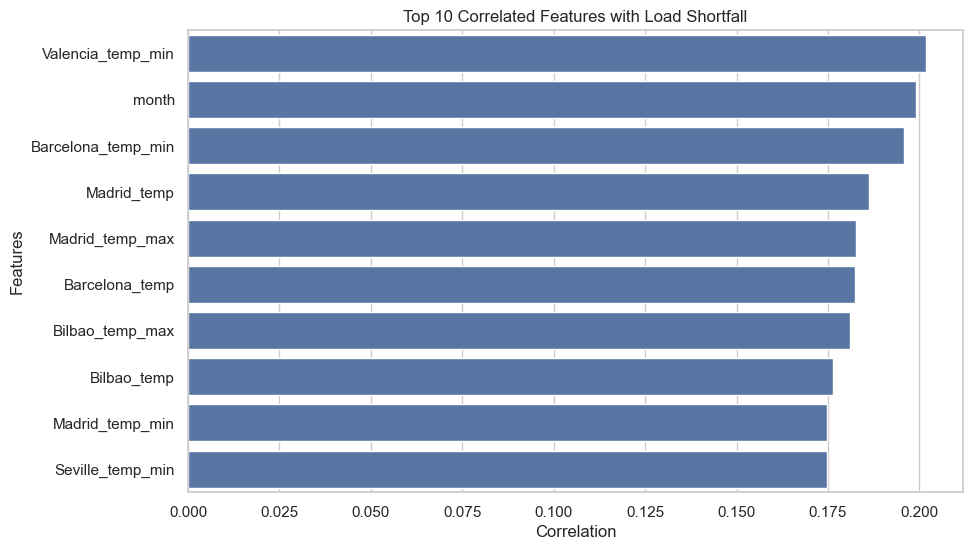

In [208]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation with target
corr = train_df.corr(numeric_only=True)['load_shortfall_3h'].drop('load_shortfall_3h').sort_values(ascending=False)

# Plot top 10 correlations
plt.figure(figsize=(10,6))
sns.barplot(x=corr[:10].values, y=corr[:10].index)
plt.title('Top 10 Correlated Features with Load Shortfall')
plt.xlabel('Correlation')
plt.ylabel('Features')
plt.show()

In [209]:
train_df.head()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h,Valencia_wind_deg_cat,Seville_pressure_cat,hour,day_of_week,month
2015-01-01 03:00:00,0.666667,0.0,0.666667,74.333333,64.000000,0.0,1.000000,0.0,223.333333,6.333333,...,269.338615,274.254667,265.938000,265.938000,6715.666667,5.0,25.0,3,3,1
2015-01-01 06:00:00,0.333333,0.0,1.666667,78.333333,64.666667,0.0,1.000000,0.0,221.000000,4.000000,...,270.376000,274.945000,266.386667,266.386667,4171.666667,10.0,25.0,6,3,1
2015-01-01 09:00:00,1.000000,0.0,1.000000,71.333333,64.333333,0.0,1.000000,0.0,214.333333,2.000000,...,275.027229,278.792000,272.708667,272.708667,4274.666667,9.0,25.0,9,3,1
2015-01-01 12:00:00,1.000000,0.0,1.000000,65.333333,56.333333,0.0,1.000000,0.0,199.666667,2.333333,...,281.135063,285.394000,281.895219,281.895219,5075.666667,8.0,25.0,12,3,1
2015-01-01 15:00:00,1.000000,0.0,1.000000,59.000000,57.000000,2.0,0.333333,0.0,185.000000,4.333333,...,282.252063,285.513719,280.678437,280.678437,6620.666667,7.0,25.0,15,3,1


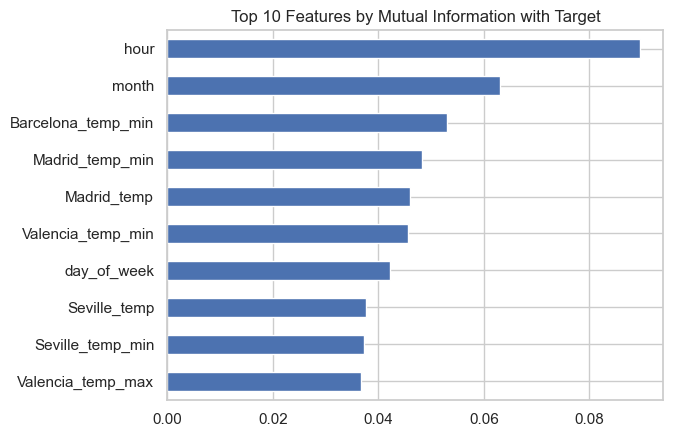

In [211]:
from sklearn.feature_selection import mutual_info_regression

from preprocessing import ValenciaPressureImputer
# Impute missing values in Valencia_pressure
valencia_pressure_imputer = ValenciaPressureImputer()
train_df['Valencia_pressure'] = valencia_pressure_imputer.fit_transform(train_df[['Valencia_pressure']])
X = train_df.drop(columns=['load_shortfall_3h'])
y = train_df['load_shortfall_3h']

mi = mutual_info_regression(X, y)
mi_series = pd.Series(mi, index=X.columns).sort_values(ascending=False)

# Plot top 10 mutual info
mi_series[:10].plot(kind='barh', title='Top 10 Features by Mutual Information with Target')
plt.gca().invert_yaxis()
plt.show()

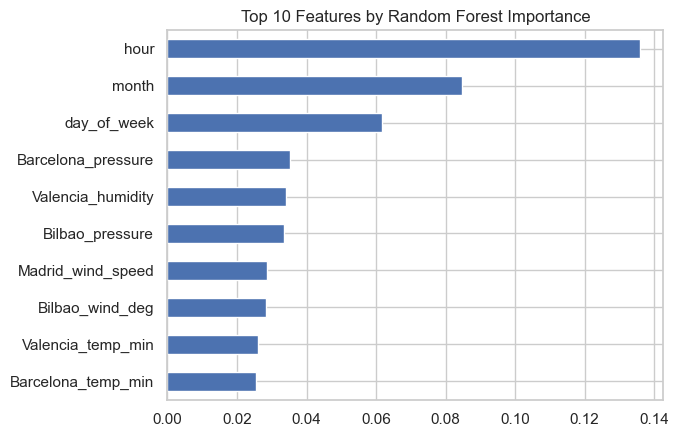

In [212]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators=100, random_state=0)
model.fit(X, y)

importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
importances[:10].plot(kind='barh', title='Top 10 Features by Random Forest Importance')
plt.gca().invert_yaxis()
plt.show()

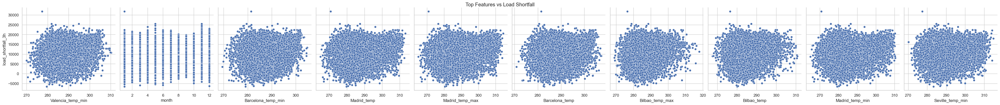

In [215]:
top_features = corr.index[:10]  # pick top 4
sns.pairplot(train_df, x_vars=top_features, y_vars='load_shortfall_3h', height=4)
plt.suptitle("Top Features vs Load Shortfall", y=1.02)
plt.show()

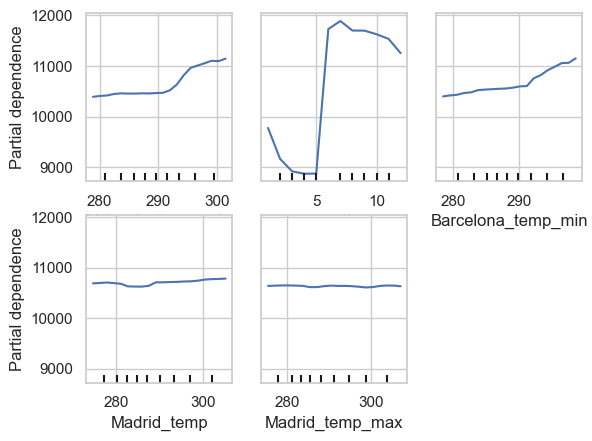

In [216]:
from sklearn.inspection import PartialDependenceDisplay

PartialDependenceDisplay.from_estimator(model, X, features=top_features[:5], kind='average', grid_resolution=20)
plt.show()

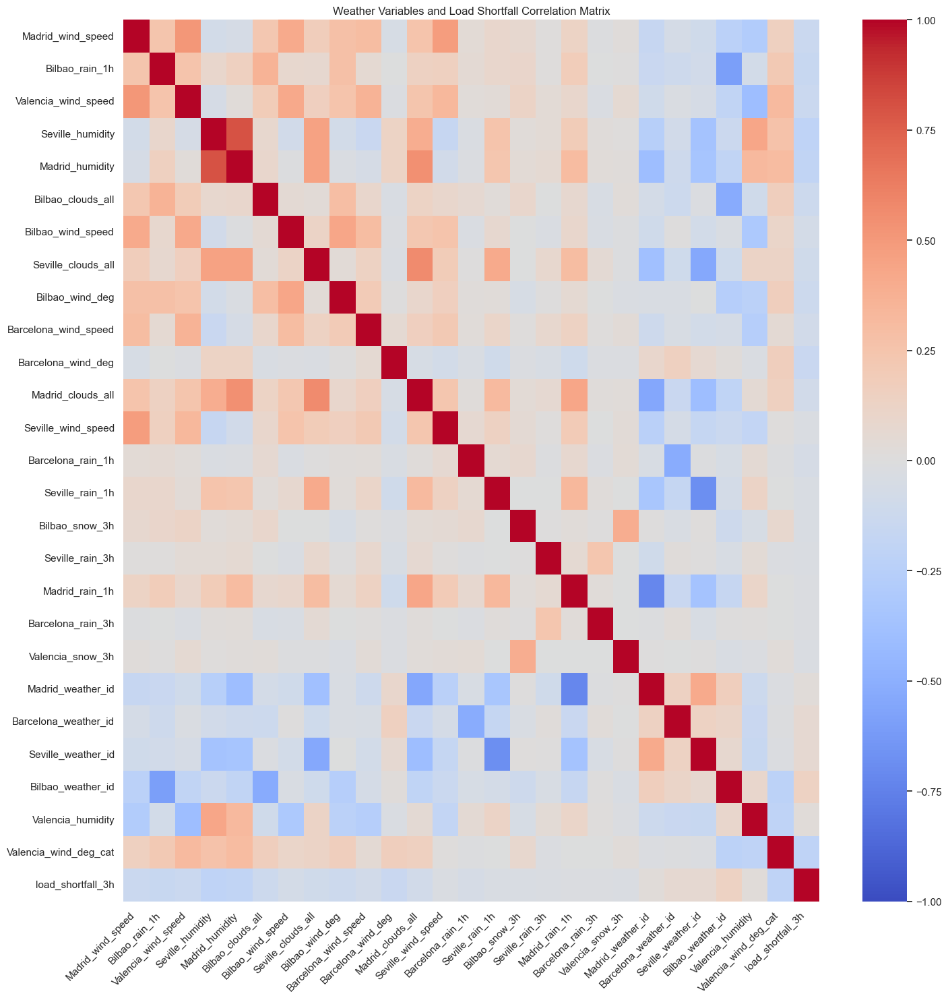

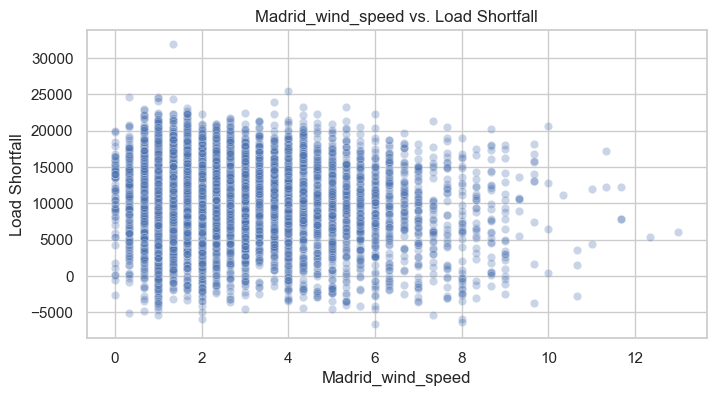

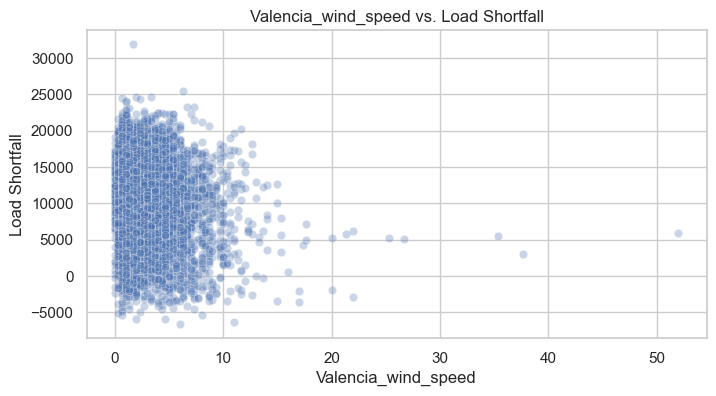

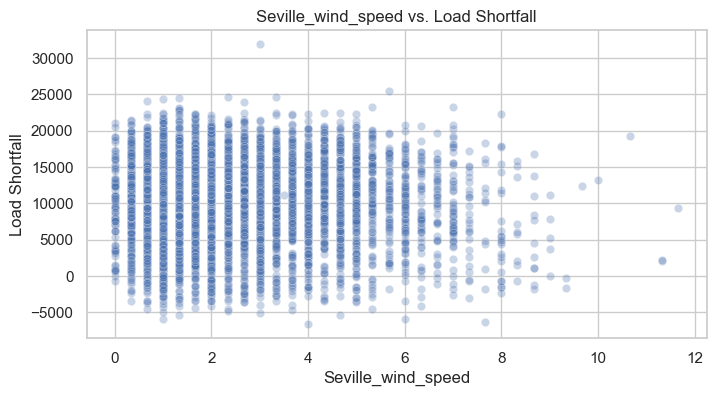

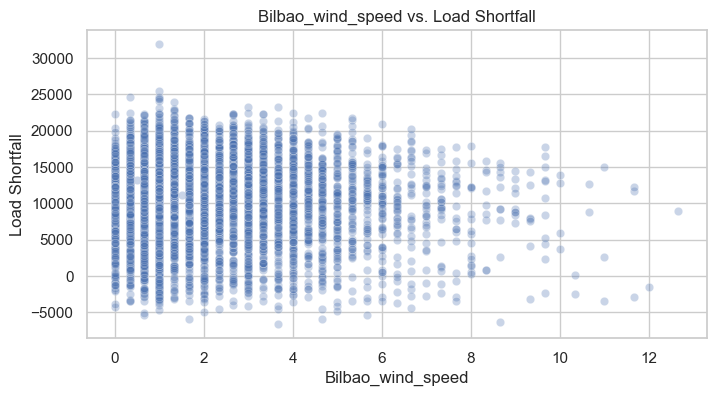

...

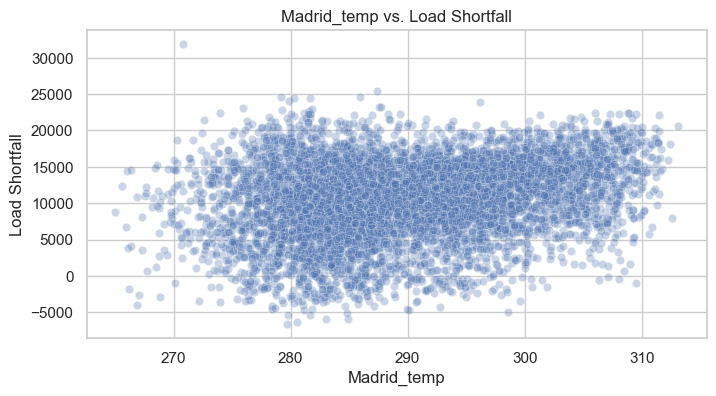

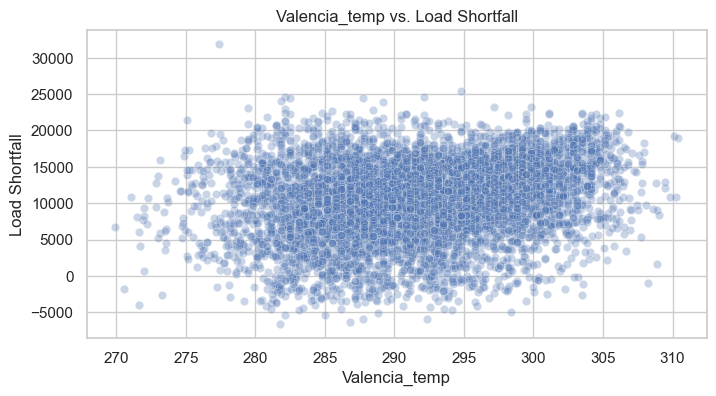

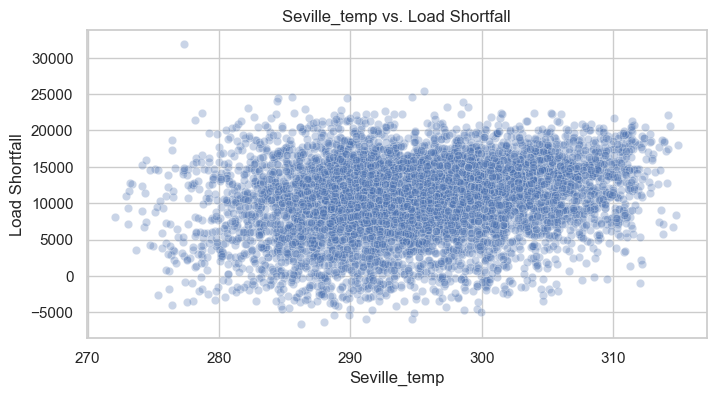

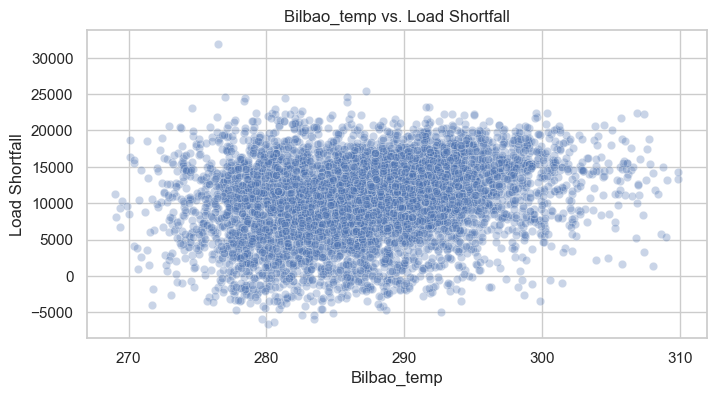

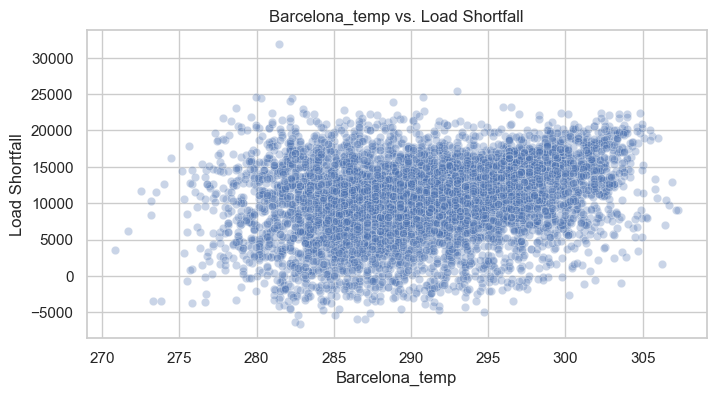

In [ ]:
analyze_weather_relationships(train_df)
plot_variables_vs_load_shortfall(train_df)

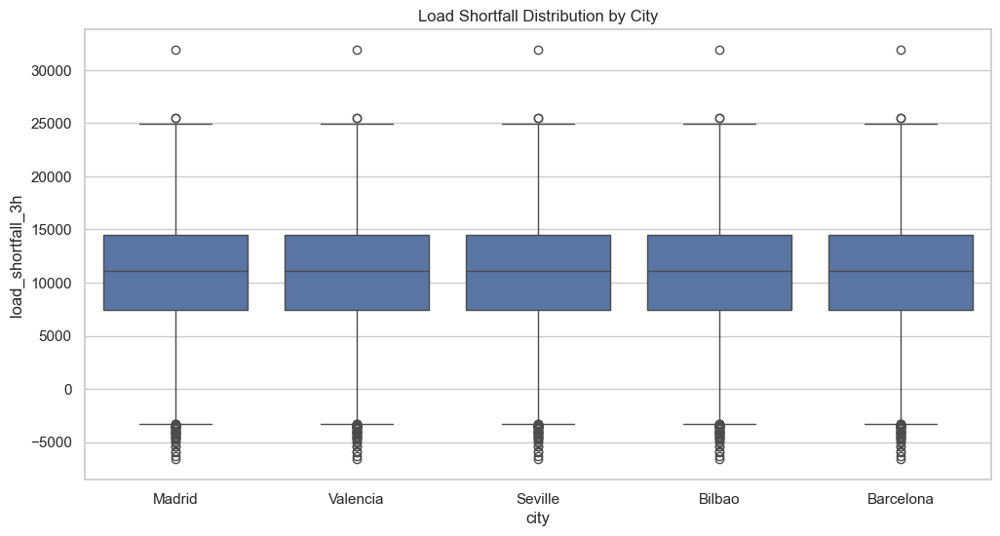

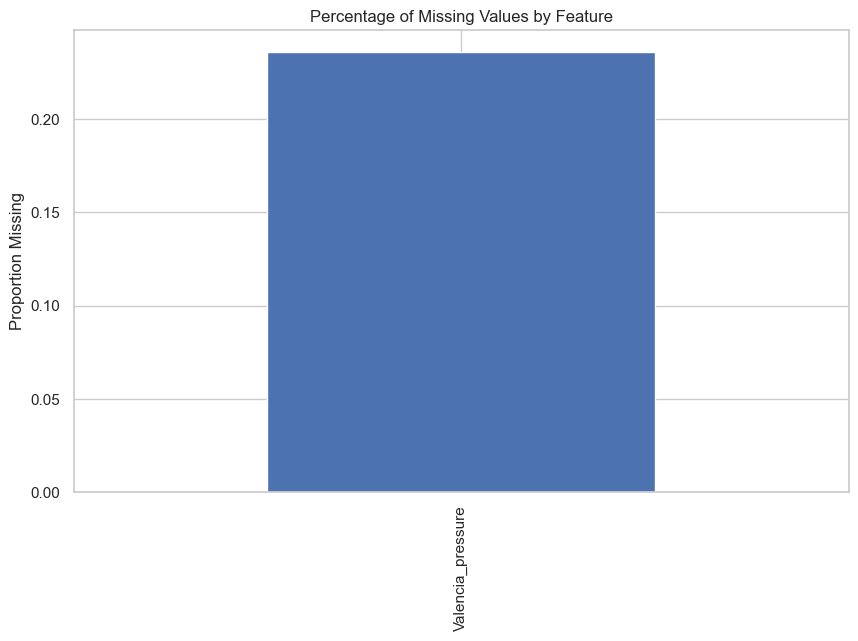

In [ ]:

analyze_city_patterns(train_df, ['Madrid', 'Valencia', 'Seville', 'Bilbao', 'Barcelona'])
analyze_data_quality(train_df)


In [ ]:
train_df[get_variables_by_type(train_df,"wind_deg")].head()

,Bilbao_wind_deg,Barcelona_wind_deg
0,223.333333,42.666667
1,221.000000,139.000000
2,214.333333,326.000000
3,199.666667,273.000000
4,185.000000,260.000000


Outlier Analysis Summary:
--------------------------------------------------------------------------------

Analyzing wind_speed variables:
----------------------------------------
Madrid_wind_speed
Valencia_wind_speed
Seville_wind_speed
Bilbao_wind_speed
Barcelona_wind_speed
            variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value     mean   median
   Madrid_wind_speed    -2.500000     6.833333            307            3.503366        0.0  13.000000 2.425729 2.000000
 Valencia_wind_speed    -3.000000     7.666667            327            3.731599        0.0  52.000000 2.586272 1.666667
  Seville_wind_speed    -2.500000     6.833333            186            2.122561        0.0  11.666667 2.425045 2.000000
   Bilbao_wind_speed    -2.333333     5.666667            380            4.336414        0.0  12.666667 1.850356 1.000000
Barcelona_wind_speed    -1.833333     7.500000            180            2.054091        0.0  12.666667 2.870497 

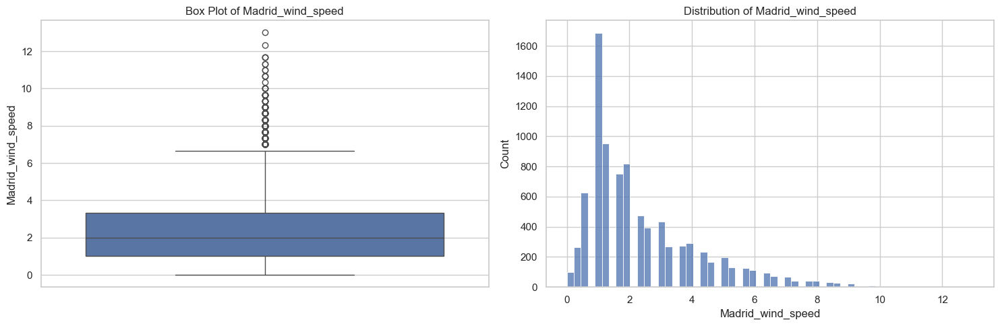

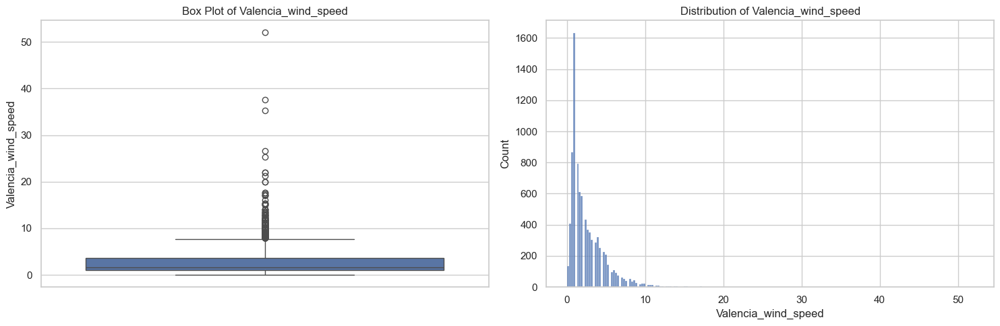

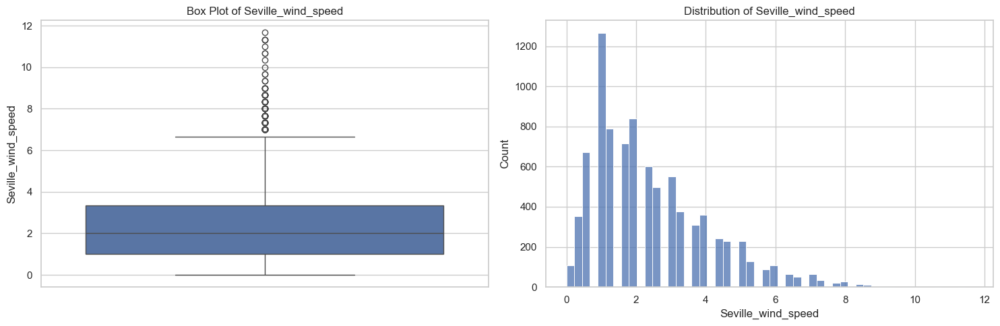

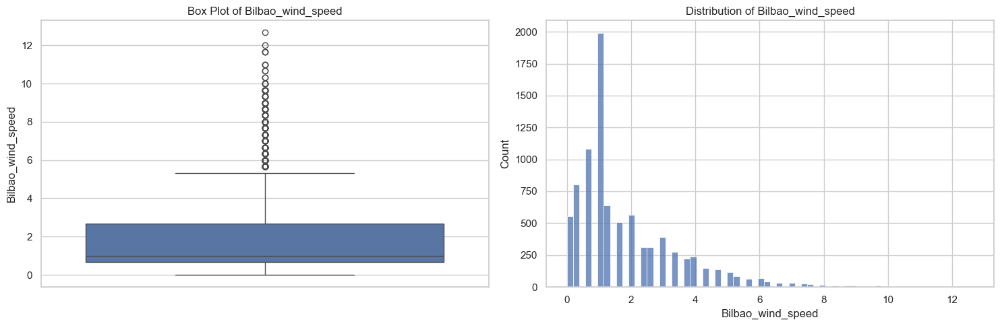

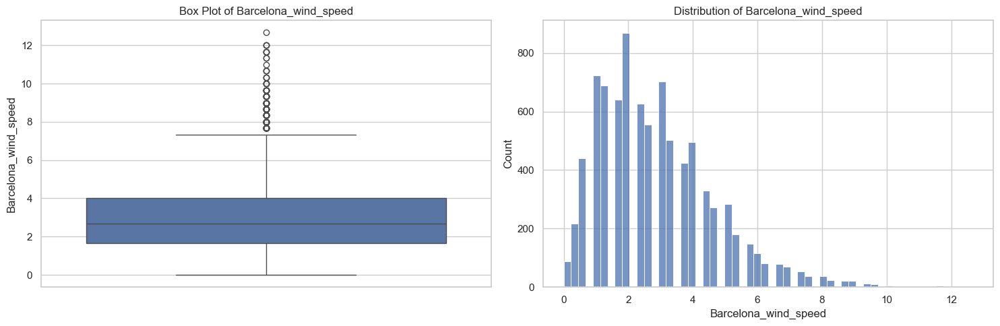



Analyzing wind_deg variables:
----------------------------------------
Bilbao_wind_deg
Barcelona_wind_deg
          variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value       mean  median
   Bilbao_wind_deg  -167.666667       475.00              0                 0.0        0.0 359.333333 158.957511   147.0
Barcelona_wind_deg   -94.583333       472.75              0                 0.0        0.0 360.000000 190.544848   200.0


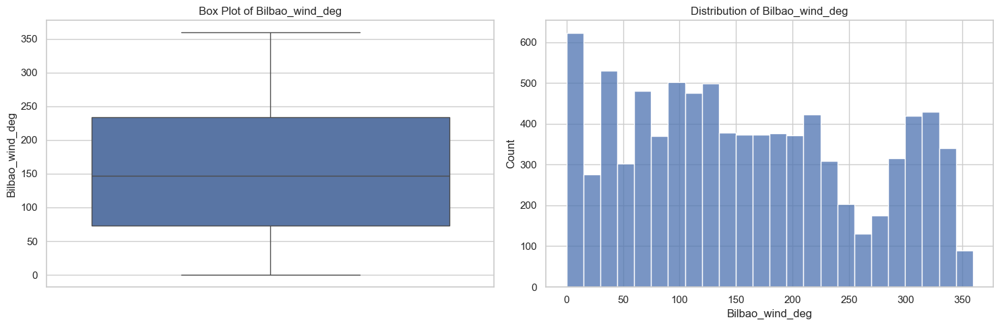

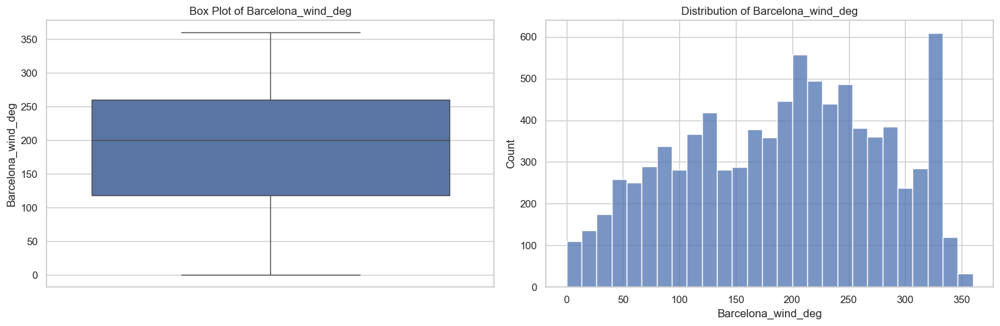



Analyzing wind_deg_cat variables:
----------------------------------------
Valencia_wind_deg_cat
             variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value     mean  median
Valencia_wind_deg_cat         -4.5         15.5              0                 0.0          1         10 5.276389     5.0


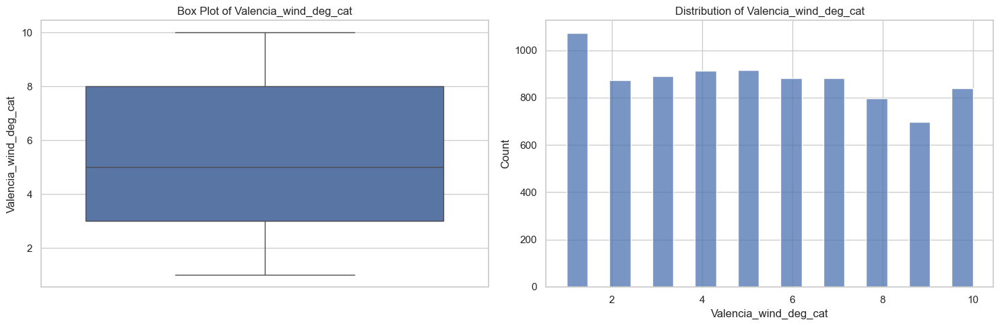



Analyzing rain_1h variables:
----------------------------------------
Madrid_rain_1h
Seville_rain_1h
Bilbao_rain_1h
Barcelona_rain_1h
         variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value     mean  median
   Madrid_rain_1h         0.00         0.00            928           10.589981        0.0        3.0 0.037818     0.0
  Seville_rain_1h         0.00         0.00            854            9.745521        0.0        3.0 0.039439     0.0
   Bilbao_rain_1h        -0.15         0.25           1576           17.984708        0.0        3.0 0.135753     0.0
Barcelona_rain_1h         0.00         0.00           1297           14.800867        0.0       12.0 0.128906     0.0


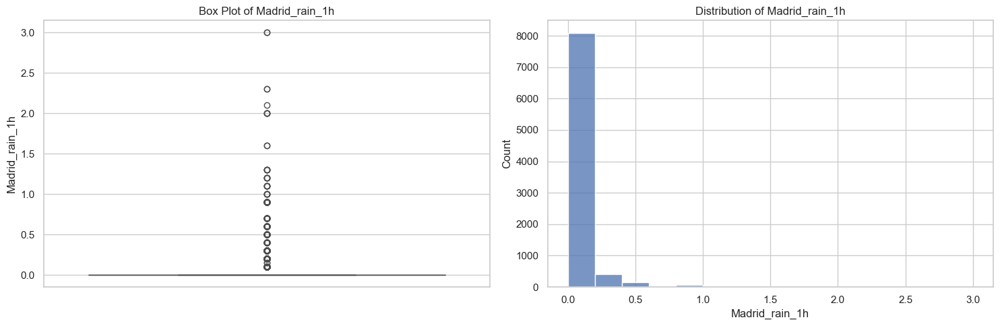

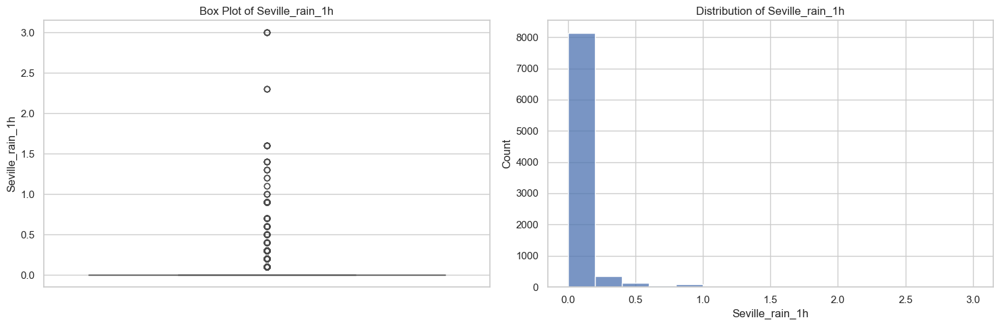

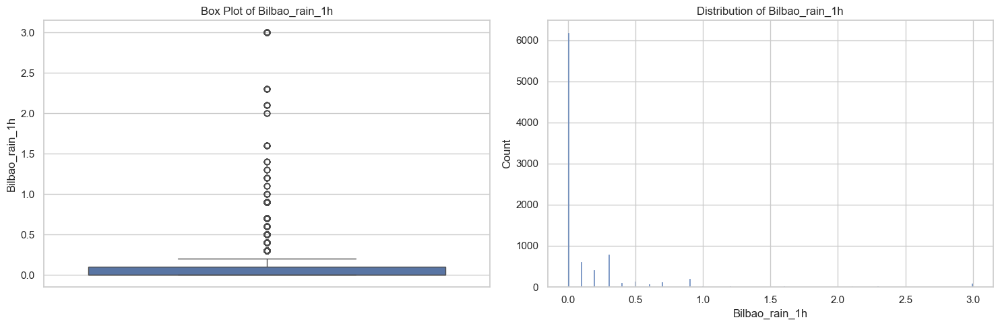

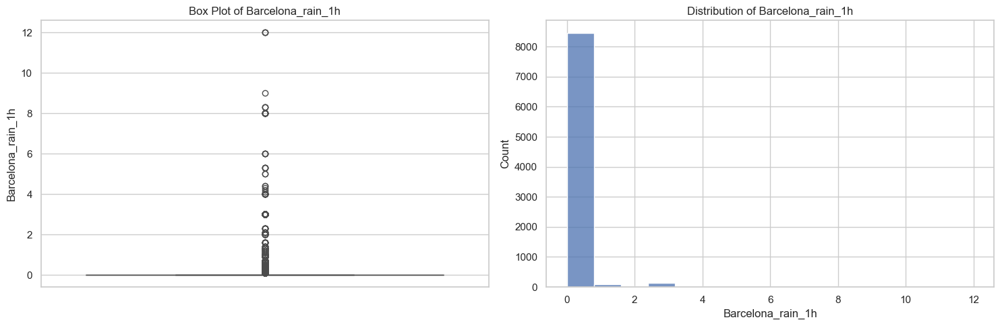



Analyzing rain_3h variables:
----------------------------------------
Seville_rain_3h
Barcelona_rain_3h
         variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value     mean  median
  Seville_rain_3h          0.0          0.0             90            1.027046        0.0   0.093333 0.000243     0.0
Barcelona_rain_3h          0.0          0.0            223            2.544791        0.0   0.093000 0.000439     0.0


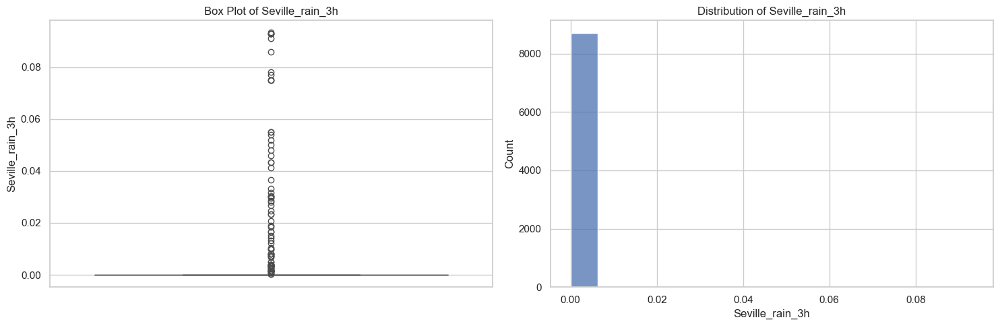

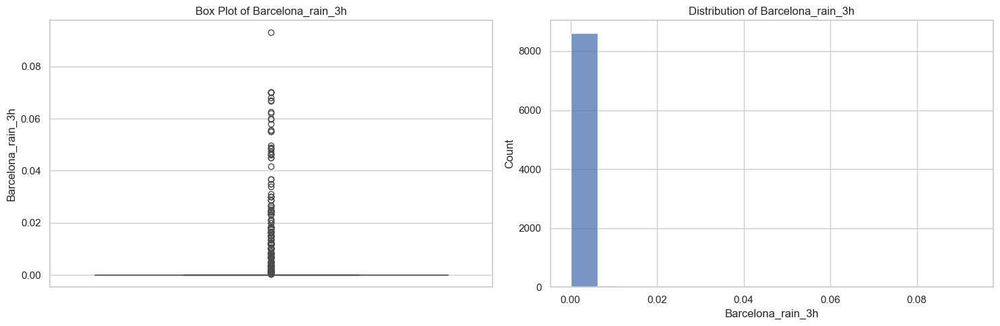



Analyzing humidity variables:
----------------------------------------
Madrid_humidity
Valencia_humidity
Seville_humidity
         variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value      mean    median
  Madrid_humidity   -27.166667   142.166667              0                 0.0   6.333333      100.0 57.414717 58.000000
Valencia_humidity     6.333333   126.333333              0                 0.0  10.333333      100.0 65.247727 67.000000
 Seville_humidity   -12.166667   138.500000              0                 0.0   8.333333      100.0 62.658793 65.666667


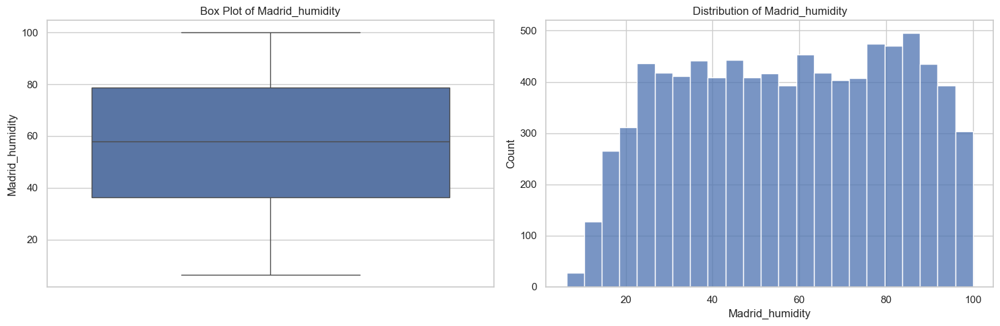

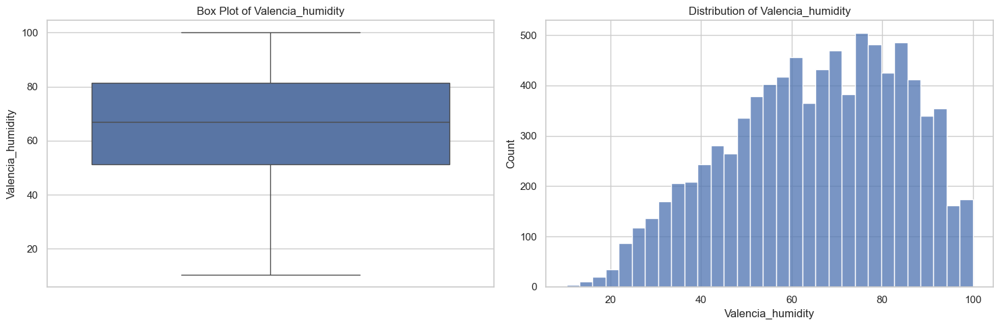

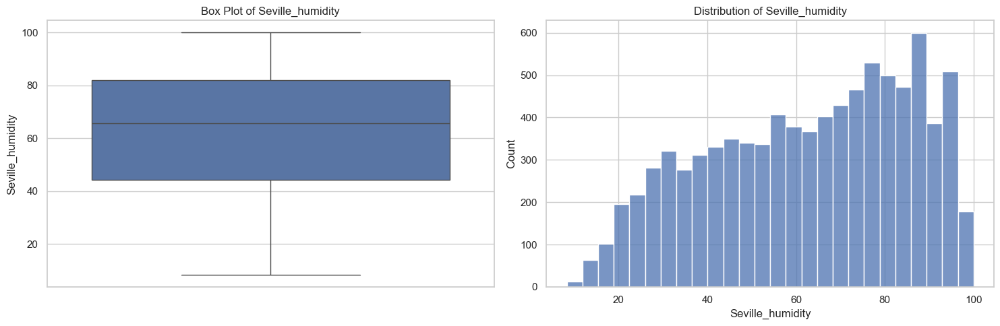



Analyzing clouds_all variables:
----------------------------------------
Madrid_clouds_all
Seville_clouds_all
Bilbao_clouds_all
          variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value  max_value      mean  median
 Madrid_clouds_all        -50.0    83.333333            310            3.537601        0.0 100.000000 19.473392     0.0
Seville_clouds_all        -30.0    50.000000           1010           11.525733        0.0  97.333333 13.714748     0.0
 Bilbao_clouds_all        -87.5   172.500000              0            0.000000        0.0 100.000000 43.469132    45.0


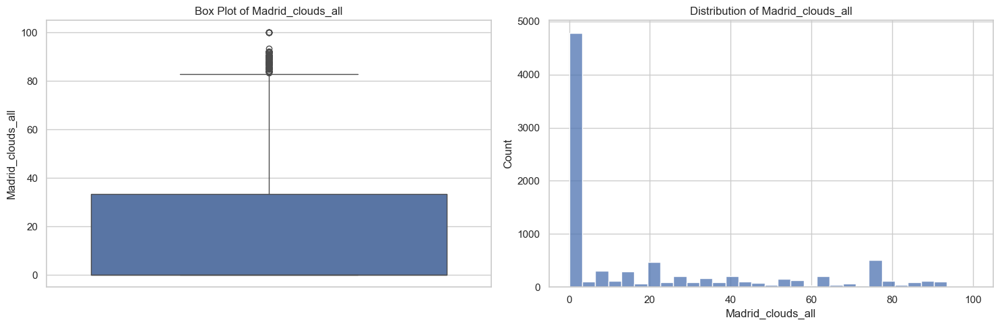

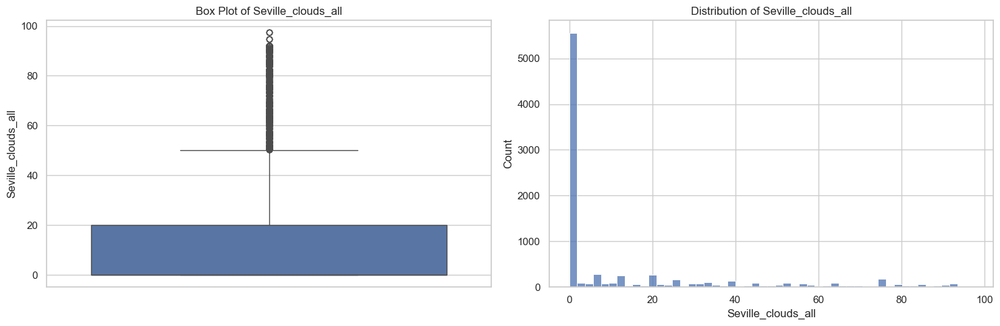

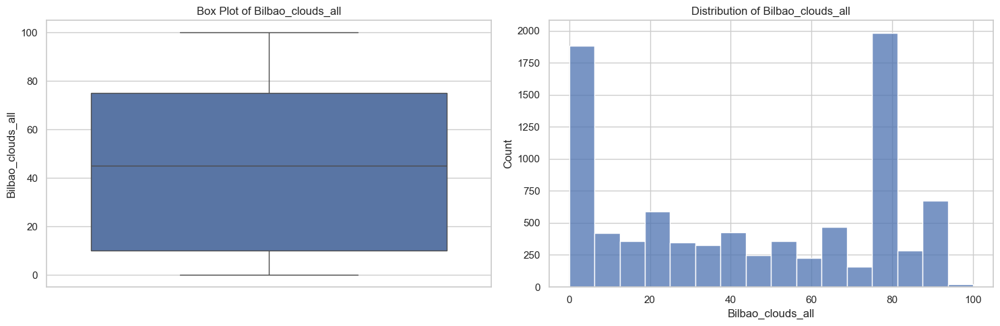



Analyzing pressure variables:
----------------------------------------
Madrid_pressure
Valencia_pressure
Bilbao_pressure
         variable  lower_bound  upper_bound  outlier_count  outlier_percentage  min_value   max_value        mean      median
  Madrid_pressure   997.833333       1036.5           1303           14.869337 927.666667 1038.000000 1010.316920 1017.333333
Valencia_pressure   998.833333       1029.5            809            9.231998 972.666667 1021.666667 1012.051407 1015.000000
  Bilbao_pressure   996.500000       1040.5            365            4.165240 971.333333 1042.000000 1017.739549 1019.000000


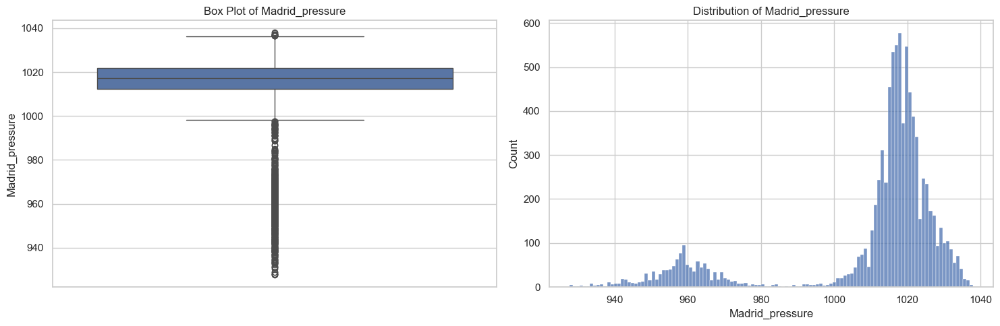

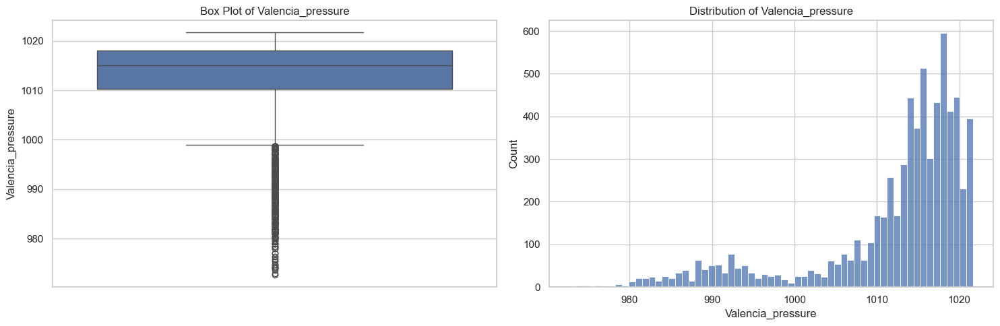

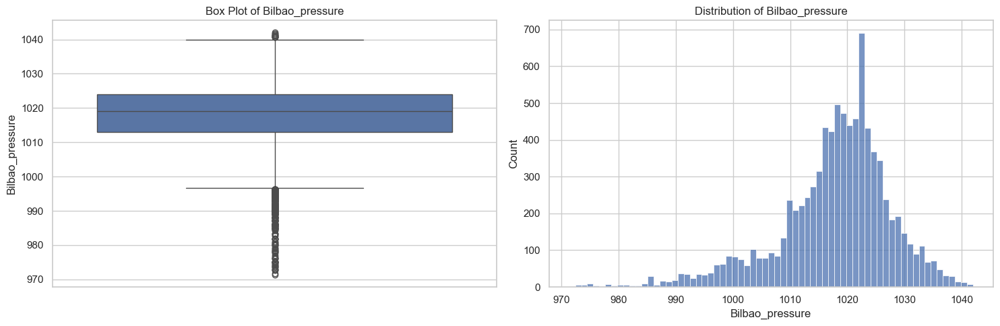

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000002EDF64B18A0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [ ]:
def detect_outliers_iqr(df, column):
    """
    Detect outliers using the IQR method for a single column.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    column : str
        The column to analyze
        
    Returns:
    --------
    tuple
        (lower_bound, upper_bound, outlier_count, outlier_percentage)
    """
    print(column)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)][column]
    outlier_count = len(outliers)
    outlier_percentage = (outlier_count / len(df)) * 100
    
    return lower_bound, upper_bound, outlier_count, outlier_percentage

def analyze_outliers_per_variable(df, variable_type):
    """
    Analyze outliers for all variables of a specific type.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    variable_type : str
        The type of variable to analyze
        
    Returns:
    --------
    pandas.DataFrame
        DataFrame containing outlier analysis results
    """
    variables = get_variables_by_type(df, variable_type)
    results = []
    
    for var in variables:
        if var=="Barcelona_pressure":
            continue
        else:
            lower_bound, upper_bound, count, percentage = detect_outliers_iqr(df, var)
            results.append({
                'variable': var,
                'lower_bound': lower_bound,
                'upper_bound': upper_bound,
                'outlier_count': count,
                'outlier_percentage': percentage,
                'min_value': df[var].min(),
                'max_value': df[var].max(),
                'mean': df[var].mean(),
                'median': df[var].median()
            })
    
    return pd.DataFrame(results)

def plot_outliers_distribution(df, variable_type):
    """
    Create box plots and histograms for all variables of a specific type.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    variable_type : str
        The type of variable to plot
    """
    variables = get_variables_by_type(df, variable_type)
    
    for var in variables:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
        
        # Box plot
        sns.boxplot(data=df, y=var, ax=ax1)
        ax1.set_title(f'Box Plot of {var}')
        
        # Histogram
        sns.histplot(data=df, x=var, ax=ax2)
        ax2.set_title(f'Distribution of {var}')
        
        plt.tight_layout()
        plt.show()

def analyze_all_variable_types(df):
    """
    Analyze outliers for all variable types and create a summary report.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    """
    variable_types = [
        'wind_speed',
        'wind_deg',
        'wind_deg_cat',
        'rain_1h',
        'rain_3h',
        'humidity',
        'clouds_all',
        'pressure',
        'pressure_cat',
        'snow_3h',
        'weather_id',
        'temp_max',
        'temp_min',
        'temp'
    ]
    
    print("Outlier Analysis Summary:")
    print("-" * 80)
    
    for var_type in variable_types:
        print(f"\nAnalyzing {var_type} variables:")
        print("-" * 40)
        
        # Get analysis results
        results = analyze_outliers_per_variable(df, var_type)
        
        # Display results
        print(results.to_string(index=False))
        
        # Create visualizations
        plot_outliers_distribution(df, var_type)
        
        print("\n" + "=" * 80)


# 3. Run complete analysis for all variable types
analyze_all_variable_types(train_df)

In [ ]:
def set_datetime_as_index(df):
    # Ensure 'time' is datetime and sorted
    df['time'] = pd.to_datetime(df['time'])
    df = df.set_index('time').sort_index()

    # Define full 3-hourly index
    full_idx = pd.date_range(start=df.index[0], end=df.index[-1], freq='3H')

    # Reindex to create uniform time steps
    df = df.reindex(full_idx)

    # Drop missing values (or use ffill/bfill if preferred)
    df = df.dropna()

    # Now let pandas enforce the frequency
    df = df.asfreq("3H")  # This is the key change

    # Drop unnamed columns if they exist
    if 'Unnamed: 0' in df.columns:
        df = df.drop(columns=['Unnamed: 0'])

    return df

train_df = set_datetime_as_index(train_df)

print((train_df.index.to_series().diff().value_counts()))

0 days 03:00:00    8765
Name: count, dtype: int64


C:\Users\lackerman008\AppData\Local\Temp\ipykernel_9256\1509459685.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_idx = pd.date_range(start=df.index[0], end=df.index[-1], freq='3H')
C:\Users\lackerman008\AppData\Local\Temp\ipykernel_9256\1509459685.py:16: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df = df.asfreq("3H")  # This is the key change


In [ ]:
print(train_df.index)

DatetimeIndex(['2015-01-01 03:00:00', '2015-01-01 06:00:00',
               '2015-01-01 09:00:00', '2015-01-01 12:00:00',
               '2015-01-01 15:00:00', '2015-01-01 18:00:00',
               '2015-01-01 21:00:00', '2015-01-02 00:00:00',
               '2015-01-02 03:00:00', '2015-01-02 06:00:00',
               ...
               '2017-12-30 15:00:00', '2017-12-30 18:00:00',
               '2017-12-30 21:00:00', '2017-12-31 00:00:00',
               '2017-12-31 03:00:00', '2017-12-31 06:00:00',
               '2017-12-31 09:00:00', '2017-12-31 12:00:00',
               '2017-12-31 15:00:00', '2017-12-31 18:00:00'],
              dtype='datetime64[ns]', length=8766, freq='3h')


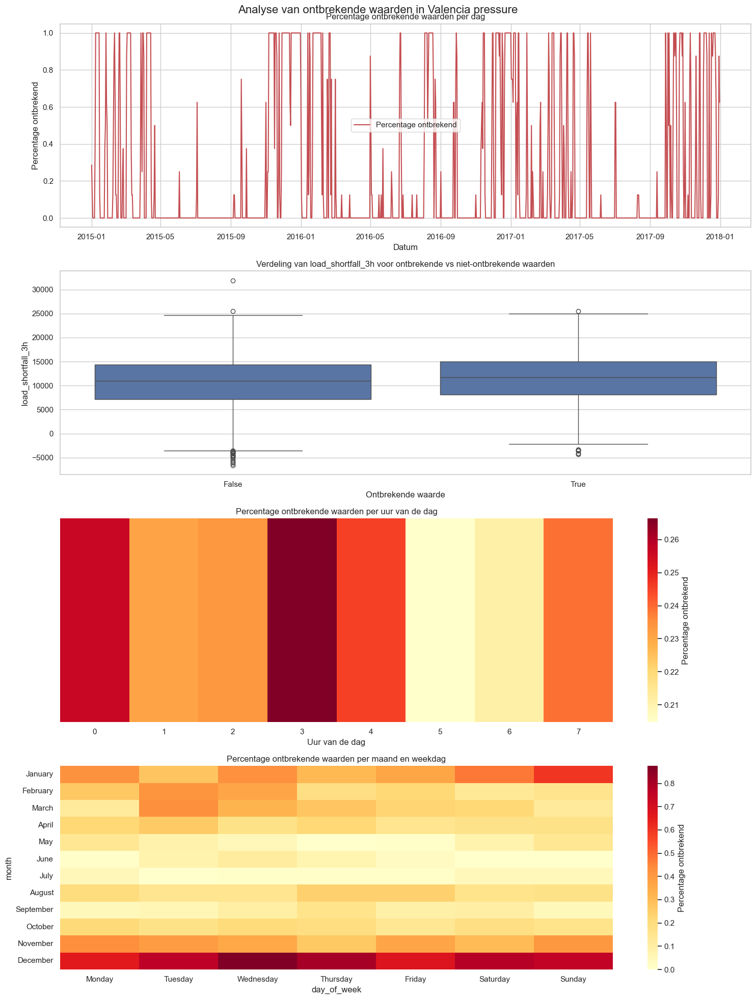


Statistieken van ontbrekende waarden:
Totaal aantal rijen: 8763
Aantal ontbrekende waarden: 2068
Percentage ontbrekend: 23.60%

Percentage ontbrekende waarden per uur:
      count  percentage
hour                   
0      1095       25.66
3      1096       23.08
6      1096       23.36
9      1096       26.64
12     1096       24.54
15     1094       20.48
18     1094       21.12
21     1096       23.91

Percentage ontbrekende waarden per weekdag:
             count  percentage
day_of_week                   
Friday        1256       21.18
Monday        1246       22.87
Saturday      1256       22.61
Sunday        1254       23.44
Thursday      1255       23.35
Tuesday       1248       25.64
Wednesday     1248       26.12

Percentage ontbrekende waarden per maand:
           count  percentage
month                       
April        720       19.44
August       744       18.68
December     744       75.81
February     678       25.07
January      741       41.30
July         744     

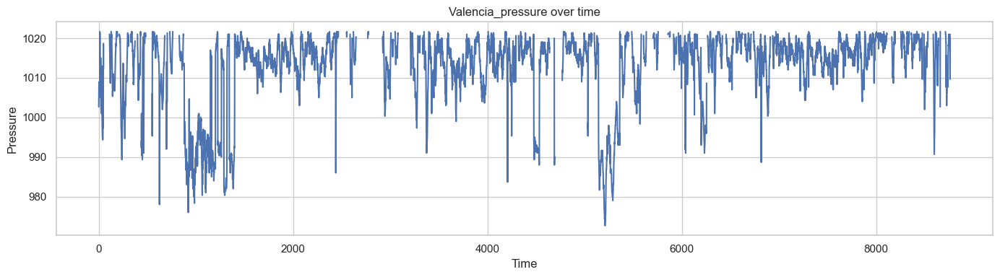

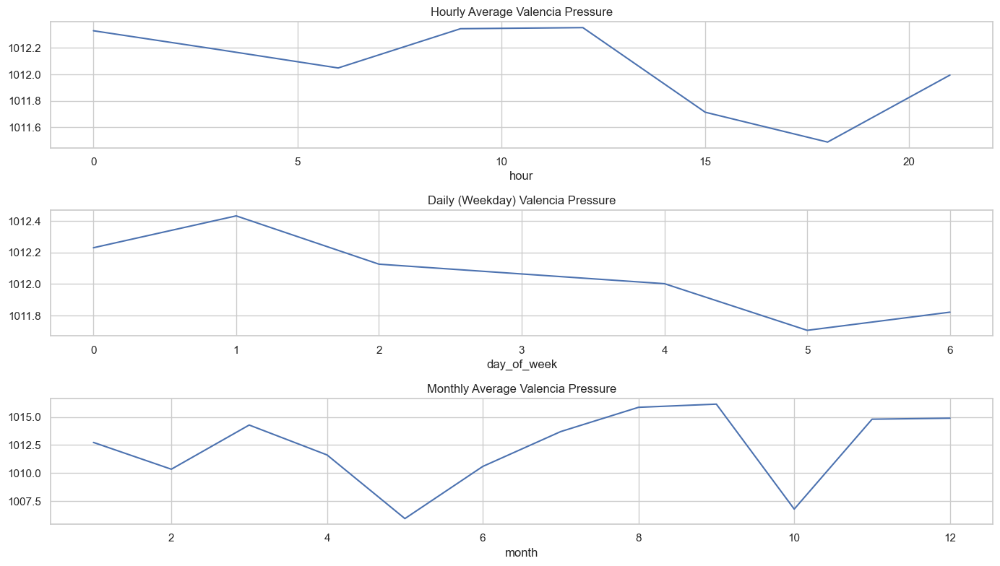

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

def analyze_missing_patterns(df, target_col='load_shortfall_3h', pressure_col='Valencia_pressure'):
    """
    Analyseer en visualiseer patronen in ontbrekende waarden van Valencia pressure
    in relatie tot de target variabele.
    """
    # Maak een kopie van de data
    df_analysis = df.copy()
    
    
    # Maak kolommen voor ontbrekende waarden en tijdseigenschappen
    df_analysis['is_missing'] = df_analysis[pressure_col].isna()
    df_analysis['hour'] = df_analysis['time'].dt.hour
    df_analysis['day_of_week'] = df_analysis['time'].dt.day_name()
    df_analysis['month'] = df_analysis['time'].dt.month_name()
    
    # Maak een figuur met meerdere subplots
    fig, axes = plt.subplots(4, 1, figsize=(15, 20))
    fig.suptitle('Analyse van ontbrekende waarden in Valencia pressure', fontsize=16)
    
    # 1. Tijdsreeks van ontbrekende waarden
    missing_over_time = df_analysis.groupby(df_analysis['time'].dt.date)['is_missing'].mean()
    axes[0].plot(missing_over_time.index, missing_over_time.values, 'r-', label='Percentage ontbrekend')
    axes[0].set_title('Percentage ontbrekende waarden per dag')
    axes[0].set_xlabel('Datum')
    axes[0].set_ylabel('Percentage ontbrekend')
    axes[0].grid(True)
    axes[0].legend()
    
    # 2. Boxplot van target variabele
    sns.boxplot(x='is_missing', y=target_col, data=df_analysis, ax=axes[1])
    axes[1].set_title(f'Verdeling van {target_col} voor ontbrekende vs niet-ontbrekende waarden')
    axes[1].set_xlabel('Ontbrekende waarde')
    axes[1].set_ylabel(target_col)
    
    # 3. Heatmap van ontbrekende waarden per uur van de dag
    missing_by_hour = df_analysis.groupby('hour')['is_missing'].mean()
    sns.heatmap(missing_by_hour.values.reshape(1, -1), 
                ax=axes[2],
                cmap='YlOrRd',
                cbar_kws={'label': 'Percentage ontbrekend'})
    axes[2].set_title('Percentage ontbrekende waarden per uur van de dag')
    axes[2].set_xlabel('Uur van de dag')
    axes[2].set_yticks([])
    
    # 4. Heatmap van ontbrekende waarden per maand en weekdag
    missing_by_month_day = pd.crosstab(
        df_analysis['month'],
        df_analysis['day_of_week'],
        values=df_analysis['is_missing'],
        aggfunc='mean'
    )
    # Sorteer de maanden en weekdagen in de juiste volgorde
    month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
                  'July', 'August', 'September', 'October', 'November', 'December']
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    missing_by_month_day = missing_by_month_day.reindex(index=month_order, columns=day_order)
    
    sns.heatmap(missing_by_month_day, 
                ax=axes[3],
                cmap='YlOrRd',
                cbar_kws={'label': 'Percentage ontbrekend'})
    axes[3].set_title('Percentage ontbrekende waarden per maand en weekdag')
    
    plt.tight_layout()
    plt.show()
    
    # Print gedetailleerde statistieken
    print("\nStatistieken van ontbrekende waarden:")
    print(f"Totaal aantal rijen: {len(df_analysis)}")
    print(f"Aantal ontbrekende waarden: {df_analysis['is_missing'].sum()}")
    print(f"Percentage ontbrekend: {(df_analysis['is_missing'].mean() * 100):.2f}%")
    
    # Statistieken per uur
    print("\nPercentage ontbrekende waarden per uur:")
    hourly_stats = df_analysis.groupby('hour')['is_missing'].agg(['count', 'sum', 'mean'])
    hourly_stats['percentage'] = hourly_stats['mean'] * 100
    print(hourly_stats[['count', 'percentage']].round(2))
    
    # Statistieken per weekdag
    print("\nPercentage ontbrekende waarden per weekdag:")
    weekday_stats = df_analysis.groupby('day_of_week')['is_missing'].agg(['count', 'sum', 'mean'])
    weekday_stats['percentage'] = weekday_stats['mean'] * 100
    print(weekday_stats[['count', 'percentage']].round(2))
    
    # Statistieken per maand
    print("\nPercentage ontbrekende waarden per maand:")
    month_stats = df_analysis.groupby('month')['is_missing'].agg(['count', 'sum', 'mean'])
    month_stats['percentage'] = month_stats['mean'] * 100
    print(month_stats[['count', 'percentage']].round(2))
    
    # Bereken correlatie tussen ontbrekende waarden en target
    correlation = df_analysis[target_col].corr(df_analysis['is_missing'])
    print(f"\nCorrelatie tussen ontbrekende waarden en {target_col}: {correlation:.4f}")
    
    return df_analysis


df_analysis = analyze_missing_patterns(train_df)

train_df["Valencia_pressure"].describe()

# Plot full time series
plt.figure(figsize=(14, 4))
train_df['Valencia_pressure'].plot()
plt.title('Valencia_pressure over time')
plt.xlabel('Time')
plt.ylabel('Pressure')
plt.grid(True)
plt.tight_layout()
plt.show()

# Time-based aggregations
train_df['hour'] = train_df['time'].dt.hour
train_df['day_of_week'] = train_df['time'].dt.dayofweek
train_df['month'] = train_df['time'].dt.month

plt.figure(figsize=(14, 8))
plt.subplot(3, 1, 1)
train_df.groupby('hour')['Valencia_pressure'].mean().plot(title='Hourly Average Valencia Pressure')
plt.subplot(3, 1, 2)
train_df.groupby('day_of_week')['Valencia_pressure'].mean().plot(title='Daily (Weekday) Valencia Pressure')
plt.subplot(3, 1, 3)
train_df.groupby('month')['Valencia_pressure'].mean().plot(title='Monthly Average Valencia Pressure')
plt.tight_layout()
plt.show()


In [180]:
from preprocessing import ValenciaPressureImputer

def analyze_valencia_pressure_imputation(df):
    """
    Applies ValenciaPressureImputer and analyzes the changes in Valencia pressure distribution.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
        
    Returns:
    --------
    tuple
        (original_df, imputed_df, imputation_stats)
    """
    # Create a copy of the original data
    original_df = df.copy()
    
    # Initialize and apply the imputer
    imputer = ValenciaPressureImputer()
    imputed_df = imputer.fit_transform(original_df)
    
    # Calculate statistics before and after imputation
    imputation_stats = {
        'original': {
            'missing_count': original_df['Valencia_pressure'].isna().sum(),
            'missing_percentage': (original_df['Valencia_pressure'].isna().sum() / len(original_df)) * 100,
            'mean': original_df['Valencia_pressure'].mean(),
            'median': original_df['Valencia_pressure'].median(),
            'std': original_df['Valencia_pressure'].std(),
            'min': original_df['Valencia_pressure'].min(),
            'max': original_df['Valencia_pressure'].max()
        },
        'imputed': {
            'missing_count': imputed_df['Valencia_pressure'].isna().sum(),
            'missing_percentage': (imputed_df['Valencia_pressure'].isna().sum() / len(imputed_df)) * 100,
            'mean': imputed_df['Valencia_pressure'].mean(),
            'median': imputed_df['Valencia_pressure'].median(),
            'std': imputed_df['Valencia_pressure'].std(),
            'min': imputed_df['Valencia_pressure'].min(),
            'max': imputed_df['Valencia_pressure'].max()
        }
    }
    
    # Create visualizations
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
    
    # Original distribution
    sns.histplot(data=original_df, x='Valencia_pressure', ax=ax1)
    ax1.set_title('Original Distribution')
    
    # Imputed distribution
    sns.histplot(data=imputed_df, x='Valencia_pressure', ax=ax2)
    ax2.set_title('Imputed Distribution')
    
    # Original box plot
    sns.boxplot(data=original_df, y='Valencia_pressure', ax=ax3)
    ax3.set_title('Original Box Plot')
    
    # Imputed box plot
    sns.boxplot(data=imputed_df, y='Valencia_pressure', ax=ax4)
    ax4.set_title('Imputed Box Plot')
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print("\nImputation Statistics:")
    print("-" * 50)
    print("\nOriginal Data:")
    for stat, value in imputation_stats['original'].items():
        print(f"{stat}: {value:.2f}")
    
    print("\nImputed Data:")
    for stat, value in imputation_stats['imputed'].items():
        print(f"{stat}: {value:.2f}")
    
    # Calculate and print changes
    print("\nChanges after imputation:")
    print("-" * 50)
    for stat in imputation_stats['original'].keys():
        if stat not in ['missing_count', 'missing_percentage']:
            change = imputation_stats['imputed'][stat] - imputation_stats['original'][stat]
            change_percentage = (change / imputation_stats['original'][stat]) * 100
            print(f"{stat}: {change:.2f} ({change_percentage:+.2f}%)")
    
    return original_df, imputed_df, imputation_stats


def analyze_temporal_patterns(original_df, imputed_df):
    """
    Analyzes and visualizes temporal patterns in Valencia pressure before and after imputation.
    
    Parameters:
    -----------
    original_df : pandas.DataFrame
        The original DataFrame
    imputed_df : pandas.DataFrame
        The imputed DataFrame
    """
    # Create temporal features for both DataFrames
    for df in [original_df, imputed_df]:
        df['hour'] = df.index.hour
        df['day'] = df.index.dayofweek
        df['month'] = df.index.month
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 15))
    
    # 1. Hourly patterns
    plt.subplot(3, 2, 1)
    original_hourly = original_df.groupby('hour')['Valencia_pressure'].mean()
    plt.plot(original_hourly.index, original_hourly.values, 'b-', label='Original')
    plt.title('Hourly Pattern (Original)')
    plt.xlabel('Hour of Day')
    plt.ylabel('Mean Pressure')
    plt.xticks(range(0, 24, 3))
    plt.grid(True)
    
    plt.subplot(3, 2, 2)
    imputed_hourly = imputed_df.groupby('hour')['Valencia_pressure'].mean()
    plt.plot(imputed_hourly.index, imputed_hourly.values, 'r-', label='Imputed')
    plt.title('Hourly Pattern (Imputed)')
    plt.xlabel('Hour of Day')
    plt.ylabel('Mean Pressure')
    plt.xticks(range(0, 24, 3))
    plt.grid(True)
    
    # 2. Daily patterns
    plt.subplot(3, 2, 3)
    original_daily = original_df.groupby('day')['Valencia_pressure'].mean()
    plt.plot(original_daily.index, original_daily.values, 'b-', label='Original')
    plt.title('Daily Pattern (Original)')
    plt.xlabel('Day of Week')
    plt.ylabel('Mean Pressure')
    plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.grid(True)
    
    plt.subplot(3, 2, 4)
    imputed_daily = imputed_df.groupby('day')['Valencia_pressure'].mean()
    plt.plot(imputed_daily.index, imputed_daily.values, 'r-', label='Imputed')
    plt.title('Daily Pattern (Imputed)')
    plt.xlabel('Day of Week')
    plt.ylabel('Mean Pressure')
    plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.grid(True)
    
    # 3. Monthly patterns
    plt.subplot(3, 2, 5)
    original_monthly = original_df.groupby('month')['Valencia_pressure'].mean()
    plt.plot(original_monthly.index, original_monthly.values, 'b-', label='Original')
    plt.title('Monthly Pattern (Original)')
    plt.xlabel('Month')
    plt.ylabel('Mean Pressure')
    plt.xticks(range(1, 13))
    plt.grid(True)
    
    plt.subplot(3, 2, 6)
    imputed_monthly = imputed_df.groupby('month')['Valencia_pressure'].mean()
    plt.plot(imputed_monthly.index, imputed_monthly.values, 'r-', label='Imputed')
    plt.title('Monthly Pattern (Imputed)')
    plt.xlabel('Month')
    plt.ylabel('Mean Pressure')
    plt.xticks(range(1, 13))
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate and print statistics for temporal patterns
    print("\nTemporal Pattern Statistics:")
    print("-" * 50)
    
    # Hourly statistics
    print("\nHourly Pattern Differences:")
    hourly_diff = imputed_hourly - original_hourly
    print(f"Mean absolute difference: {hourly_diff.abs().mean():.2f}")
    print(f"Maximum difference: {hourly_diff.abs().max():.2f}")
    
    # Daily statistics
    print("\nDaily Pattern Differences:")
    daily_diff = imputed_daily - original_daily
    print(f"Mean absolute difference: {daily_diff.abs().mean():.2f}")
    print(f"Maximum difference: {daily_diff.abs().max():.2f}")
    
    # Monthly statistics
    print("\nMonthly Pattern Differences:")
    monthly_diff = imputed_monthly - original_monthly
    print(f"Mean absolute difference: {monthly_diff.abs().mean():.2f}")
    print(f"Maximum difference: {monthly_diff.abs().max():.2f}")
    
    # Clean up temporary columns
    for df in [original_df, imputed_df]:
        df.drop(['hour', 'day', 'month'], axis=1, inplace=True)

def analyze_valencia_pressure_imputation_with_temporal(df):
    """
    Combines the original imputation analysis with temporal pattern analysis.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame containing the data
    """
    # Run original analysis
    original_df, imputed_df, stats = analyze_valencia_pressure_imputation(df)
    
    # Add temporal pattern analysis
    print("\nAnalyzing Temporal Patterns...")
    analyze_temporal_patterns(original_df, imputed_df)
    
    return original_df, imputed_df, stats



NameError: name 'sns' is not defined

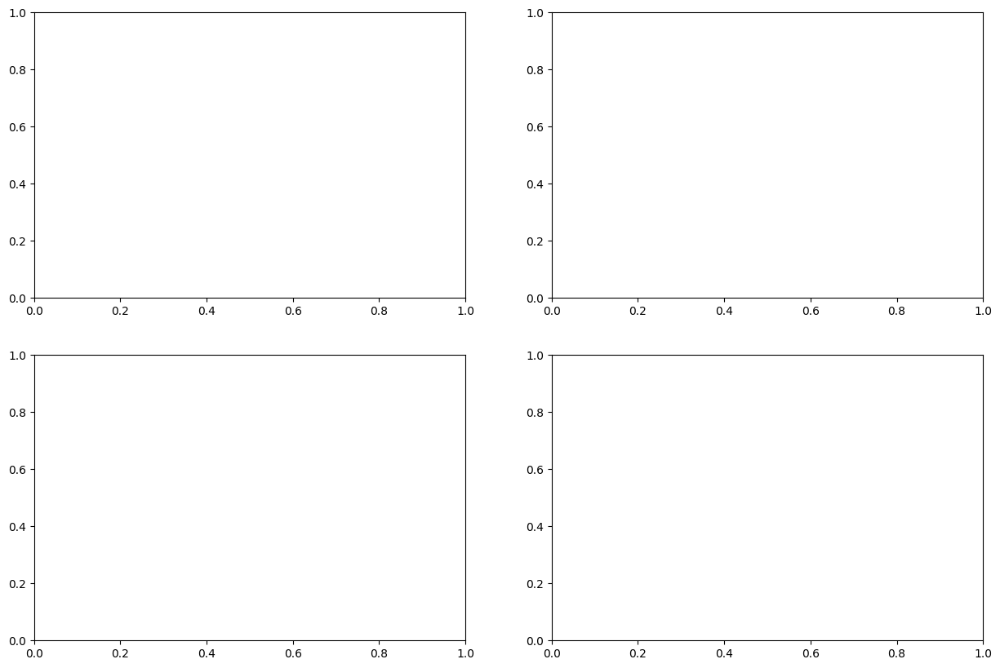

In [181]:
# Example usage:
original_df, imputed_df, stats = analyze_valencia_pressure_imputation_with_temporal(train_df)

In [ ]:
def check_nan_in_column(df, column):
    """
    Checks the number of NaN values in a specific column.
    
    Parameters:
    -----------
    df : pandas.DataFrame
        The DataFrame to analyze
    column : str
        The column name to check
        
    Returns:
    --------
    tuple
        (nan_count, nan_percentage)
    """
    nan_count = df[column].isna().sum()
    nan_percentage = (nan_count / len(df)) * 100
    
    print(f"\nNaN Analysis for column '{column}':")
    print(f"Number of NaN values: {nan_count}")
    print(f"Percentage of NaN values: {nan_percentage:.2f}%")
    
    return nan_count, nan_percentage

nan_count, nan_percentage = check_nan_in_column(train_df, 'load_shortfall_3h')
print(nan_count)



NaN Analysis for column 'load_shortfall_3h':
Number of NaN values: 0
Percentage of NaN values: 0.00%
0


In [ ]:
from models import AR1Model
 
model = AR1Model()
model.fit(train_df["load_shortfall_3h"])

model.predict(train_df["load_shortfall_3h"])



8763      4130.697398
8764      5249.771950
8765      6177.401096
8766      6946.336312
8767      7583.726124
             ...     
17521    10672.133296
17522    10672.133296
17523    10672.133296
17524    10672.133296
17525    10672.133296
Length: 8763, dtype: float64